## Using an API & Pulling Data

API 101 |
Client: The application submitting the request
Server: The application sending the response to the request

Using an open source API from the website below
https://coinmarketcap.com/

In [1]:
#The code for the API was derived from the API Doc on the site, the API Key used was given to me when I set up the account
from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json

url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
parameters = {
  'start':'1',
  'limit':'5000',
  'convert':'USD'
}
headers = {
  'Accepts': 'application/json',
  'X-CMC_PRO_API_KEY': '3b6b1b8d-5923-4582-8106-23419cec6bd9',
}

session = Session()
session.headers.update(headers)

try:
  response = session.get(url, params=parameters)
  data = json.loads(response.text)
  print(data)
except (ConnectionError, Timeout, TooManyRedirects) as e:
  print(e)
  

{'status': {'timestamp': '2024-07-17T14:39:32.975Z', 'error_code': 0, 'error_message': None, 'elapsed': 490, 'credit_count': 25, 'notice': None, 'total_count': 9988}, 'data': [{'id': 1, 'name': 'Bitcoin', 'symbol': 'BTC', 'slug': 'bitcoin', 'num_market_pairs': 11605, 'date_added': '2010-07-13T00:00:00.000Z', 'tags': ['mineable', 'pow', 'sha-256', 'store-of-value', 'state-channel', 'coinbase-ventures-portfolio', 'three-arrows-capital-portfolio', 'polychain-capital-portfolio', 'binance-labs-portfolio', 'blockchain-capital-portfolio', 'boostvc-portfolio', 'cms-holdings-portfolio', 'dcg-portfolio', 'dragonfly-capital-portfolio', 'electric-capital-portfolio', 'fabric-ventures-portfolio', 'framework-ventures-portfolio', 'galaxy-digital-portfolio', 'huobi-capital-portfolio', 'alameda-research-portfolio', 'a16z-portfolio', '1confirmation-portfolio', 'winklevoss-capital-portfolio', 'usv-portfolio', 'placeholder-ventures-portfolio', 'pantera-capital-portfolio', 'multicoin-capital-portfolio', 'pa

Getting the Data in a usable state


Note if you have a problem pulling data and the error you get is that 'Jupyter is limiting the amount of data it sends' then close Jupyter. Open it up by first increasing the limit in my pc terminal using this code 'jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000 --NotebookApp.rate_limit_window=10.0'

In [2]:
type(data)

dict

In [14]:
import pandas as pd

#this code allows us to see every column more clearly
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [22]:
#this makes the data look neater in the dataframe
df = pd.json_normalize(data['data'])
df

NameError: name 'data' is not defined

## Automating the data pull from a Crypto Website 

Automating the data pull

Creating a timestmap so I know what time of day the automated data pull ran

In [16]:
#Adding a column called timestamp
df['timestamp'] = pd.to_datetime('now')
df

/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_25965/4050044027.py:2: FutureWarning: The parsing of 'now' in pd.to_datetime without `utc=True` is deprecated. In a future version, this will match Timestamp('now') and Timestamp.now()
  df['timestamp'] = pd.to_datetime('now')


,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,11605,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19726928.00000,19726928,False,NaN,1,NaN,NaN,NaN,2024-07-17T14:38:00.000Z,65177.25174,37072776658.29297,-10.57930,0.43836,2.22973,12.88032,-0.73506,-2.66662,1.95407,1285746952409.06934,53.86460,1368722286642.41992,NaN,2024-07-17T14:38:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-17 14:43:43.313743
1,1027,Ethereum,ETH,ethereum,9144,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120221218.02997,120221218.02997,True,NaN,2,NaN,NaN,NaN,2024-07-17T14:37:00.000Z,3465.62369,18915105129.38762,-7.09910,0.17698,1.81683,11.52883,-1.90689,11.35622,12.39134,416641501392.90521,17.45460,416641501392.90997,NaN,2024-07-17T14:37:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-17 14:43:43.313743
2,825,Tether USDt,USDT,tether,91779,2015-02-25T00:00:00.000Z,"[stablecoin, asset-backed-stablecoin, avalanch...",NaN,113224555138.64410,117072162581.78760,True,NaN,3,NaN,NaN,NaN,2024-07-17T14:37:00.000Z,1.00016,69224574829.83401,-8.66110,0.01186,-0.01909,0.04238,0.10143,-0.04848,-0.02699,113243084714.60294,4.74420,117091321831.53000,NaN,2024-07-17T14:37:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2024-07-17 14:43:43.313743
3,1839,BNB,BNB,bnb,2192,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,147582060.52641,147582060.52641,False,NaN,4,NaN,NaN,NaN,2024-07-17T14:37:00.000Z,577.03802,1852054649.19076,-9.89320,0.18287,1.53545,10.06773,-4.19528,0.09388,4.48153,85160460617.32231,3.56770,85160460617.32001,NaN,2024-07-17T14:37:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-17 14:43:43.313743
4,5426,Solana,SOL,solana,705,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,464174991.17710,580286508.58398,True,NaN,5,NaN,NaN,NaN,2024-07-17T14:37:00.000Z,161.12038,2605132995.25042,-9.83750,0.16151,3.37716,14.20347,11.69694,-7.12240,16.04346,74788050429.60136,3.13310,93495982102.66000,NaN,2024-07-17T14:37:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-17 14:43:43.313743
5,52,XRP,XRP,xrp,1354,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",100000000000.00000,55805339473.00000,99987452475,False,NaN,6,NaN,NaN,NaN,2024-07-17T14:38:00.000Z,0.61259,3734455286.55064,35.84190,-2.17195,6.66381,40.58209,18.81123,17.49041,22.31389,34185948877.24304,1.43220,61259279488.45000,NaN,2024-07-17T14:38:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-17 14:43:43.313743
6,3408,USDC,USDC,usd-coin,21020,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,33874717285.46158,33874717285.46158,False,NaN,7,NaN,NaN,NaN,2024-07-17T14:37:00.000Z,0.99998,7164711463.30347,-10.81810,0.00973,-0.00173,0.01653,-0.00478,-0.03242,0.00138,33874087187.14132,1.42380,33874087187.14000,NaN,2024-07-17T14:37:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2024-07-17 14:43:43.313743
7,11419,Toncoin,TON,toncoin,462,2021-08-26T13:40:22.000Z,"[pos, layer-1, ftx-bankruptcy-estate, dwf-labs...",NaN,2512028934.71421,5109102144.12720,True,NaN,8,3414166606.00000,24775448784.00661,NaN,2024-07-17T14:37:00.000Z,7.25666,250607475.19519,-14.37310,0.32722,-0.78364,-0.45188,-7.63900,12.70708,17.32850,18228941758.89977,0.76370,37075020967.53000,NaN,2024-07-17T14:37:00.000Z,NaN,NaN,NaN,NaN,

We want data to keep being added overtime to the dataframe above

Thus,we want to create a script that will automatically append data to the dataframe, running at scheduled intervals.

So I will utilise the original code that pulled data statically and turn it into a function. Then create another function to run the previoysly created function at scheduled intervals.

In [42]:
import os
import json
import pandas as pd
from requests import Session, ConnectionError, Timeout, TooManyRedirects
from datetime import datetime
from time import sleep

# Initialize an empty DataFrame
df = pd.DataFrame()

# Create the function to  pull data via the API and add it to the df
def api_runner():
    global df
    url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
    parameters = {
        'start': '1',
        'limit': '5000',
        'convert': 'USD'
    }
    headers = {
        'Accepts': 'application/json',
        'X-CMC_PRO_API_KEY': '3b6b1b8d-5923-4582-8106-23419cec6bd9',
    }

    session = Session()
    session.headers.update(headers)

    try:
        response = session.get(url, params=parameters)
        data = json.loads(response.text)
    except (ConnectionError, Timeout, TooManyRedirects) as e:
        print(e)
        return

    df2 = pd.json_normalize(data['data'])
    df2['Timestamp'] = datetime.now()
    df = df.append(df2, ignore_index=True)

# Define the path to the CSV file, where it will be saved.
    csv_path = r'/Users/dorianeumuhoza/Library/Mobile Documents/com~apple~CloudDocs/1. My Documents/5. Learning/5.DataAnalysisAlexTheAnalyst/Projects/API.csv'

# Save the dataframe to a CSV file, appending it with data if it exists
    if not os.path.isfile(csv_path):
        df.to_csv(csv_path, index=False, header=True)
    else:
        df.to_csv(csv_path, mode='a', index=False, header=False)

#Create a function utilsing the Data Pull function above, to run the above function every 60 seconds a max of 333 times as per the API permissions
def main():
    for i in range(333):
        api_runner()
        print('API runner completed successfully')
        sleep(60) # Sleep for 1 minute, thus running every 60 seconds

if __name__ == "__main__":
    main()


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2038255261.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df2, ignore_index=True)


API runner completed successfully


KeyboardInterrupt: 

I want to read the contents of the file from the file path, to ensure it was added

In [43]:
import pandas as pd

# Path to the CSV file
csv_path = r'/Users/dorianeumuhoza/Library/Mobile Documents/com~apple~CloudDocs/1. My Documents/5. Learning/5.DataAnalysisAlexTheAnalyst/Projects/API.csv'

# Try reading the CSV file while handling errors
try:
    # Attempt to read the CSV, skipping problematic lines
    dfx = pd.read_csv(csv_path, on_bad_lines='skip')
    print("CSV file read successfully, with problematic lines skipped.")
except pd.errors.ParserError as e:
    print(f"Error reading CSV: {e}")

# Display the dataframe
dfx.head()

/var/folders/41/x17f1w4d1xz50f5hyskp84480000gn/T/ipykernel_3915/2203598171.py:9: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  dfx = pd.read_csv(csv_path, on_bad_lines='skip')


CSV file read successfully, with problematic lines skipped.


,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,...,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,Timestamp
0,1,Bitcoin,BTC,bitcoin,11606,2010-07-13T00:00:00.000Z,"['mineable', 'pow', 'sha-256', 'store-of-value...",21000000.00000,19727234.00000,19727234.00000,...,53.91440,1362915941136.35010,NaN,2024-07-18T09:31:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-18 11:33:15.458938
1,1027,Ethereum,ETH,ethereum,9146,2015-08-07T00:00:00.000Z,"['pos', 'smart-contracts', 'ethereum-ecosystem...",NaN,120222728.17831,120222728.17831,...,17.51850,415675385139.21002,NaN,2024-07-18T09:30:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-18 11:33:15.458938
2,825,Tether USDt,USDT,tether,91864,2015-02-25T00:00:00.000Z,"['stablecoin', 'asset-backed-stablecoin', 'ava...",NaN,113632416636.03844,117072162581.68192,...,4.78580,117085661949.23000,NaN,2024-07-18T09:30:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2024-07-18 11:33:15.458938
3,1839,BNB,BNB,bnb,2193,2017-07-25T00:00:00.000Z,"['marketplace', 'centralized-exchange', 'payme...",NaN,147582016.76892,147582016.76892,...,3.57320,84853204257.02000,NaN,2024-07-18T09:30:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-18 11:33:15.458938
4,5426,Solana,SOL,solana,706,2020-04-10T00:00:00.000Z,"['pos', 'platform', 'solana-ecosystem', 'cms-h...",NaN,464276657.97007,580445497.50366,...,3.12470,92767077746.78000,NaN,2024-07-18T09:30:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-18 11:33:15.458938


In [47]:
dfx

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,...,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,Timestamp
0,1,Bitcoin,BTC,bitcoin,11606,2010-07-13T00:00:00.000Z,"['mineable', 'pow', 'sha-256', 'store-of-value...",21000000.00000,19727234.00000,19727234.00000,...,53.91440,1362915941136.35010,NaN,2024-07-18T09:31:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-18 11:33:15.458938
1,1027,Ethereum,ETH,ethereum,9146,2015-08-07T00:00:00.000Z,"['pos', 'smart-contracts', 'ethereum-ecosystem...",NaN,120222728.17831,120222728.17831,...,17.51850,415675385139.21002,NaN,2024-07-18T09:30:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-18 11:33:15.458938
2,825,Tether USDt,USDT,tether,91864,2015-02-25T00:00:00.000Z,"['stablecoin', 'asset-backed-stablecoin', 'ava...",NaN,113632416636.03844,117072162581.68192,...,4.78580,117085661949.23000,NaN,2024-07-18T09:30:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2024-07-18 11:33:15.458938
3,1839,BNB,BNB,bnb,2193,2017-07-25T00:00:00.000Z,"['marketplace', 'centralized-exchange', 'payme...",NaN,147582016.76892,147582016.76892,...,3.57320,84853204257.02000,NaN,2024-07-18T09:30:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-18 11:33:15.458938
4,5426,Solana,SOL,solana,706,2020-04-10T00:00:00.000Z,"['pos', 'platform', 'solana-ecosystem', 'cms-h...",NaN,464276657.97007,580445497.50366,...,3.12470,92767077746.78000,NaN,2024-07-18T09:30:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-18 11:33:15.458938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
964995,23097,T23,T23,t23,3,2022-12-30T09:23:06.000Z,[],1000000000000000.00000,0.00000,1000000000000000.00000,...,0.00000,345796.08000,NaN,2024-07-18T10:34:00.000Z,1839.00000,BNB Smart Chain (BEP20),BNB,bnb,0x897F2BE515373Cf1F899D864B5Be2bD5eFd4e653,2024-07-18 12:36:46.176405
964996,31364,GameStop,GSTOP,gamestop-coin,3,2024-05-22T10:28:20.000Z,[],1000000000.00000,0.00000,1000000000.00000,...,0.00000,164128.41000,NaN,2024-07-18T10:34:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdd157bd06c1840fa886da18a138c983a7d74c1d7,2024-07-18 12:36:46.176405
964997,30113,Ton Inu,TINU,ton-inu,2,2024-04-15T06:57:35.000Z,['toncoin-ecosystem'],1000000000.00000,0.00000,1000000000.00000,...,0.00000,980916.96000,NaN,2024-07-18T10:34:00.000Z,11419.00000,TON,TON,toncoin,EQA6Q3dMgVEfXQ9tNBL2fMljEhI_azQ-R3vvPgjGOXwoF7kt,2024-07-18 12:36:46.176405
964998,31741,ICPSwap Token,ICS,icpswap-token,2,2024-06-11T06:01:57.000Z,[],1000000000.00000,0.00000,998812482.00000,...,0.00000,26240281.24000,NaN,2024-07-18T10:34:00.000Z,8916.00000,ICP,ICP,internet-computer,ca6gz-lqaaa-aaaaq-aacwa-cai,2024-07-18 12:36:46.176405


In [48]:
#cleaning up scientific notation
pd.set_option('display.float_format', lambda x: '%.5f' % x)

In [49]:
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,...,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,Timestamp
0,1,Bitcoin,BTC,bitcoin,11606,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19727259.00000,19727259,...,53.91500,1358325459041.08008,NaN,2024-07-18T10:16:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-18 12:17:47.983485
1,1027,Ethereum,ETH,ethereum,9146,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120222728.17831,120222728.17831,...,17.48970,414084449582.27002,NaN,2024-07-18T10:15:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-18 12:17:47.983485
2,825,Tether USDt,USDT,tether,91870,2015-02-25T00:00:00.000Z,"[stablecoin, asset-backed-stablecoin, avalanch...",NaN,113632416636.03844,117072162581.68193,...,4.80150,117107059082.52000,NaN,2024-07-18T10:15:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2024-07-18 12:17:47.983485
3,1839,BNB,BNB,bnb,2193,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,147582013.97870,147582013.97870,...,3.57610,84634599275.96001,NaN,2024-07-18T10:15:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-18 12:17:47.983485
4,5426,Solana,SOL,solana,706,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,464276545.49658,580445387.01171,...,3.12190,92396656942.99001,NaN,2024-07-18T10:15:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-07-18 12:17:47.983485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94995,23097,T23,T23,t23,3,2022-12-30T09:23:06.000Z,[],1000000000000000.00000,0.00000,1000000000000000,...,0.00000,345796.08000,NaN,2024-07-18T10:34:00.000Z,1839.00000,BNB Smart Chain (BEP20),BNB,bnb,0x897F2BE515373Cf1F899D864B5Be2bD5eFd4e653,2024-07-18 12:36:46.176405
94996,31364,GameStop,GSTOP,gamestop-coin,3,2024-05-22T10:28:20.000Z,[],1000000000.00000,0.00000,1000000000,...,0.00000,164128.41000,NaN,2024-07-18T10:34:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdd157bd06c1840fa886da18a138c983a7d74c1d7,2024-07-18 12:36:46.176405
94997,30113,Ton Inu,TINU,ton-inu,2,2024-04-15T06:57:35.000Z,[toncoin-ecosystem],1000000000.00000,0.00000,1000000000,...,0.00000,980916.96000,NaN,2024-07-18T10:34:00.000Z,11419.00000,TON,TON,toncoin,EQA6Q3dMgVEfXQ9tNBL2fMljEhI_azQ-R3vvPgjGOXwoF7kt,2024-07-18 12:36:46.176405
94998,31741,ICPSwap Token,ICS,icpswap-token,2,2024-06-11T06:01:57.000Z,[],1000000000.00000,0.00000,998812482,...,0.00000,26240281.24000,NaN,2024-07-18T10:34:00.000Z,8916.00000,ICP,ICP,internet-computer,ca6gz-lqaaa-aaaaq-aacwa-cai,2024-07-18 12:36:46.176405


In [50]:
#Looking at the crypto coin trends over time
#Grouping the data according to Crypto type. Calling specific columns

df4 = df.groupby('name', sort=False)[['quote.USD.percent_change_1h', 'quote.USD.percent_change_24h', 'quote.USD.percent_change_7d', 'quote.USD.percent_change_30d', 'quote.USD.percent_change_60d', 'quote.USD.percent_change_90d']].mean()
df4

,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d
name,,,,,,
Bitcoin,-0.39518,-0.94784,10.89606,-1.29847,-3.98354,-0.28059
Ethereum,-0.37605,-1.27265,9.59193,0.52435,10.57372,11.15106
Tether USDt,0.00719,-0.01381,0.03408,0.04184,0.02409,-0.04237
BNB,-0.26512,-1.30924,7.76439,-2.36596,-1.15183,2.45307
Solana,-0.52936,-2.61372,11.48252,15.37221,-8.24408,10.19084
...,...,...,...,...,...,...
Grimace,-3.04698,-6.98651,8.09969,1.29963,-37.30979,-38.68854
QMALL TOKEN,-0.11118,-2.36571,7.55068,-9.23718,-39.84735,-58.18001
LFG,15.43896,29.47656,-0.49835,-54.08844,-62.92084,-90.27003


In [51]:
df5 = df4.stack()
df5

name                                 
Bitcoin  quote.USD.percent_change_1h     -0.39518
         quote.USD.percent_change_24h    -0.94784
         quote.USD.percent_change_7d     10.89606
         quote.USD.percent_change_30d    -1.29847
         quote.USD.percent_change_60d    -3.98354
                                           ...   
Ton Inu  quote.USD.percent_change_24h    10.06832
         quote.USD.percent_change_7d     -2.15540
         quote.USD.percent_change_30d   -50.25318
         quote.USD.percent_change_60d   -43.56500
         quote.USD.percent_change_90d   -79.00310
Length: 29706, dtype: float64

In [52]:
type(df4)

pandas.core.frame.DataFrame

In [53]:
type(df5)

pandas.core.series.Series

In [54]:
#We want df5 to be in df format
df6 = df5.to_frame(name = 'values')
df6

values
name                                          
Bitcoin quote.USD.percent_change_1h   -0.39518
        quote.USD.percent_change_24h  -0.94784
        quote.USD.percent_change_7d   10.89606
        quote.USD.percent_change_30d  -1.29847
        quote.USD.percent_change_60d  -3.98354
...                                        ...
Ton Inu quote.USD.percent_change_24h  10.06832
        quote.USD.percent_change_7d   -2.15540
        quote.USD.percent_change_30d -50.25318
        quote.USD.percent_change_60d -43.56500
        quote.USD.percent_change_90d -79.00310

[29706 rows x 1 columns]

In [55]:
df6.count() 

values    29706
dtype: int64

In [56]:
#Create an index
index = pd.Index(range(29706))
df7 = df6.reset_index()
df7

,name,level_1,values
0,Bitcoin,quote.USD.percent_change_1h,-0.39518
1,Bitcoin,quote.USD.percent_change_24h,-0.94784
2,Bitcoin,quote.USD.percent_change_7d,10.89606
3,Bitcoin,quote.USD.percent_change_30d,-1.29847
4,Bitcoin,quote.USD.percent_change_60d,-3.98354
...,...,...,...
29701,Ton Inu,quote.USD.percent_change_24h,10.06832
29702,Ton Inu,quote.USD.percent_change_7d,-2.15540
29703,Ton Inu,quote.USD.percent_change_30d,-50.25318
29704,Ton Inu,quote.USD.percent_change_60d,-43.56500


In [57]:
df7['level_1'] = df7['level_1'].replace(['quote.USD.percent_change_1h','quote.USD.percent_change_24h','quote.USD.percent_change_7d','quote.USD.percent_change_30d','quote.USD.percent_change_60d','quote.USD.percent_change_90d'],['1h','24h','7d','30d','60d','90d'])
df7

,name,level_1,values
0,Bitcoin,1h,-0.39518
1,Bitcoin,24h,-0.94784
2,Bitcoin,7d,10.89606
3,Bitcoin,30d,-1.29847
4,Bitcoin,60d,-3.98354
...,...,...,...
29701,Ton Inu,24h,10.06832
29702,Ton Inu,7d,-2.15540
29703,Ton Inu,30d,-50.25318
29704,Ton Inu,60d,-43.56500


In [58]:
df7 = df7.rename(columns={'level_1': 'percent_change'})
df7

,name,percent_change,values
0,Bitcoin,1h,-0.39518
1,Bitcoin,24h,-0.94784
2,Bitcoin,7d,10.89606
3,Bitcoin,30d,-1.29847
4,Bitcoin,60d,-3.98354
...,...,...,...
29701,Ton Inu,24h,10.06832
29702,Ton Inu,7d,-2.15540
29703,Ton Inu,30d,-50.25318
29704,Ton Inu,60d,-43.56500


Visualising the percentage change in the price of Bitcoin over time

                      name  quote.USD.price                  Timestamp
0                  Bitcoin      64682.16472 2024-07-18 12:17:47.983485
3325           Jinbi Token      10974.89624 2024-07-18 12:17:47.983485
4032         Bitcoin TRC20      64567.21942 2024-07-18 12:17:47.983485
4494  Dynamic Crypto Index       9772.97343 2024-07-18 12:17:47.983485
4696             BTC Proxy      65151.75848 2024-07-18 12:17:47.983485


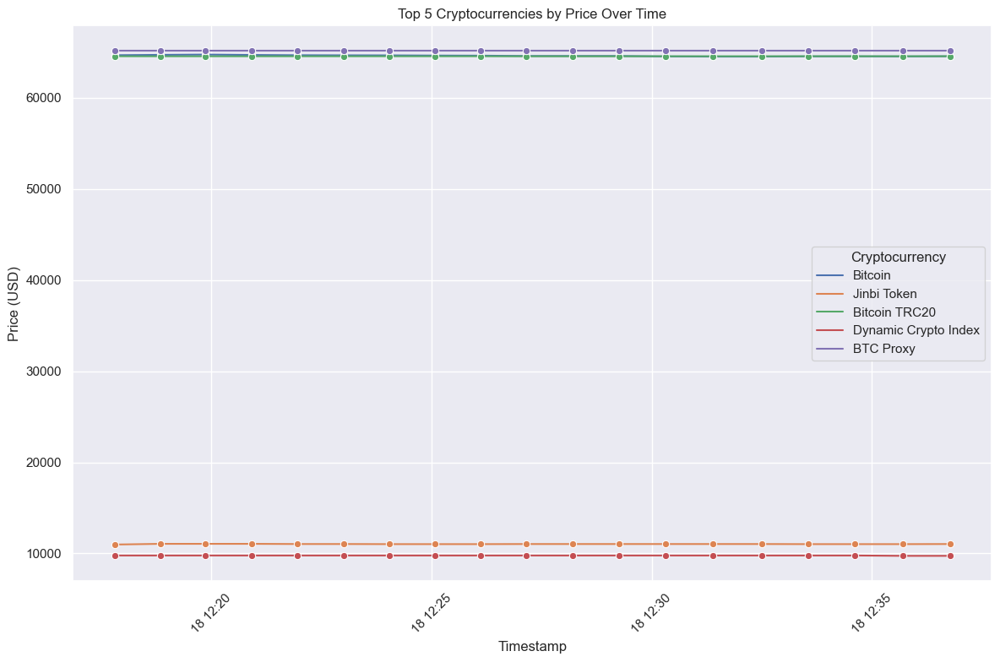

In [59]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure the DataFrame contains the necessary data
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

# Select the relevant columns
df9 = df[['name', 'quote.USD.price', 'Timestamp']]

# Sort the DataFrame based on 'quote.USD.price' and select the top 5 cryptocurrencies
top_5_crypto = df9.sort_values(by='quote.USD.price', ascending=False).groupby('name').head(1).nlargest(5, 'quote.USD.price')

# Filter the DataFrame to include only the top 5 cryptocurrencies over time
top_5_crypto_names = top_5_crypto['name'].unique()
filtered_df = df9[df9['name'].isin(top_5_crypto_names)]

# Display the filtered DataFrame
print(filtered_df.head())

# Visualize the top 5 cryptocurrencies using a line plot
plt.figure(figsize=(12, 8))
sns.lineplot(data=filtered_df, x='Timestamp', y='quote.USD.price', hue='name', marker='o')
plt.title('Top 5 Cryptocurrencies by Price Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Price (USD)')
plt.xticks(rotation=45)
plt.legend(title='Cryptocurrency')
plt.tight_layout()
plt.show()
